# THE BRIDGE (Data Science Bootcamp - Agosto 2020)
##  PROYECTO GRUPO D 
________________
### Análisis de datos asociados al COVID-19 del grupo de paises conformado por Portugal, Venezuela, Turquía, Reino Unido y España.

Fuente de datos (Data Set)  [https://covid.ourworldindata.org/data/owid-covid-data.csv]

Team members: 
- ** José Luis Manjon **     presimanjon@yahoo.es        git @JoseLuisManjon
- ** Filipa Teles      **    filipa.teles@icloud.com     git @Filipate
- ** Mónica Villasuso  **    villasuso.monica@gmail.com  git @MVillasuso
_________________

## 1. Librerías requeridas para el análisis (* Import *)
_________

In [1]:
import sys 
sys.path.append('../src/utils') 
import pandas as pd 
import numpy as np
from datetime import datetime
import folders_tb as ftb
import visualization_tb as vtb
import mining_data_tb as mtb

## 2. Carga de datos inicial, de la fuente, en el dataframe        
## *covid_general*
____________

In [2]:
url = "https://covid.ourworldindata.org/data/owid-covid-data.csv"
covid_general = pd.read_csv(url, sep=",")

## 3. Preparación de los datos - Data wrangling and Data cleaning
________________
Exploración de los datos del dataframe

In [3]:
covid_general.shape

(40959, 40)

In [4]:
covid_general.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40959 entries, 0 to 40958
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         40713 non-null  object 
 1   continent                        40467 non-null  object 
 2   location                         40959 non-null  object 
 3   date                             40959 non-null  object 
 4   total_cases                      40384 non-null  float64
 5   new_cases                        40202 non-null  float64
 6   new_cases_smoothed               39420 non-null  float64
 7   total_deaths                     40384 non-null  float64
 8   new_deaths                       40202 non-null  float64
 9   new_deaths_smoothed              39420 non-null  float64
 10  total_cases_per_million          40138 non-null  float64
 11  new_cases_per_million            40138 non-null  float64
 12  new_cases_smoothed

In [5]:
covid_general.index

RangeIndex(start=0, stop=40959, step=1)

In [6]:
# Revisión de los datos globales para ver si hay información totalizada (continent or country tienen valor  Null) y eliminarla posteriormente para el análisis
covid_general[(covid_general.continent.isnull()) | (covid_general.iso_code.isnull())]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
40467,OWID_WRL,NaN,World,2019-12-31,27.0,27.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
40468,OWID_WRL,NaN,World,2020-01-01,27.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
40469,OWID_WRL,NaN,World,2020-01-02,27.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
40470,OWID_WRL,NaN,World,2020-01-03,44.0,17.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
40471,OWID_WRL,NaN,World,2020-01-04,44.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40954,NaN,NaN,International,2020-08-28,696.0,NaN,NaN,7.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40955,NaN,NaN,International,2020-08-29,696.0,NaN,NaN,7.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40956,NaN,NaN,International,2020-08-30,696.0,NaN,NaN,7.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40957,NaN,NaN,International,2020-08-31,696.0,NaN,NaN,7.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Dataframe mundial sin los datos globales (continent) o de países con valor Nan  
### * world_df * 
____________

In [7]:
world_df = mtb.world (covid_general)

In [8]:
world_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40259 entries, 0 to 40465
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   iso_code                         40259 non-null  object        
 1   continent                        40259 non-null  object        
 2   location                         40259 non-null  object        
 3   date                             40259 non-null  datetime64[ns]
 4   total_cases                      39684 non-null  float64       
 5   new_cases                        39684 non-null  float64       
 6   new_cases_smoothed               38907 non-null  float64       
 7   total_deaths                     39684 non-null  float64       
 8   new_deaths                       39684 non-null  float64       
 9   new_deaths_smoothed              38907 non-null  float64       
 10  total_cases_per_million          39684 non-null  float64  

In [9]:
world_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,NaN,0.0,0.0,NaN,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,NaN,0.0,0.0,NaN,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,NaN,0.0,0.0,NaN,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,NaN,0.0,0.0,NaN,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40461,ZWE,Africa,Zimbabwe,2020-08-27,6251.0,55.0,86.857,179.0,13.0,4.143,...,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49
40462,ZWE,Africa,Zimbabwe,2020-08-28,6292.0,41.0,78.143,189.0,10.0,5.429,...,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49
40463,ZWE,Africa,Zimbabwe,2020-08-29,6388.0,96.0,81.857,195.0,6.0,6.143,...,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49
40464,ZWE,Africa,Zimbabwe,2020-08-30,6406.0,18.0,73.286,196.0,1.0,6.143,...,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49



### Ranking con respecto al total de países
What position do your countries occupe respect to the number of total infected, total deaths and total recoveries?
______________

In [10]:
world_df = mtb.crear_rank(world_df)

### ANÁLISIS CONJUNTO PAISES DEL GRUPO D
### PORTUGAL, VENEZUELA, TURQUÍA, GRAN BRETAÑA y ESPAÑA
________________

### Dataframe de los datos correspondientes a los países del grupo D
### * covid_grupoD *

In [11]:
paises_grupoD=["PRT", "VEN", "TUR", "GBR", "ESP"]
paises_nombres={"PRT":"Portugal", "VEN":"Venezuela", "TUR":"Turquía", "GBR":"Gran Bretaña", "ESP":"España"}

In [12]:
covid_grupoD = mtb.crear_df_grupo (world_df, paises_grupoD)

In [13]:
#Selección de los registros a partir de la fecha en que comenzaron a reportar  datos de COVID
covid_grupoD[covid_grupoD["date"] == covid_grupoD["date"].min()]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
34218,ESP,Europe,Spain,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0,NaN
38275,GBR,Europe,United Kingdom,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,20.0,24.7,NaN,2.54,81.32,2.0,1.0,2.0,1.0,NaN


 *NOTA: A pesar de que tanto España como el Reino Unido tienen registros desde el 31/12/2019, estos No contienen información relacionada al Covid 19*

In [14]:
covid_grupoD.new_cases.value_counts(dropna = False).sum()

1015

In [15]:
# Verificar si hay alguna columna donde TODOS sus datos sean nulos y por lo tanto no aporte información al análisis
covid_grupoD.isnull().sum()

iso_code                              0
continent                             0
location                              0
date                                  0
total_cases                           3
new_cases                             3
new_cases_smoothed                   30
total_deaths                          3
new_deaths                            3
new_deaths_smoothed                  30
total_cases_per_million               3
new_cases_per_million                 3
new_cases_smoothed_per_million       30
total_deaths_per_million              3
new_deaths_per_million                3
new_deaths_smoothed_per_million      30
new_tests                           554
total_tests                         519
total_tests_per_thousand            519
new_tests_per_thousand              554
new_tests_smoothed                  421
new_tests_smoothed_per_thousand     421
tests_per_case                      423
positive_rate                       423
tests_units                         393


In [16]:
# Validación de la fecha mínima y máxima en que cada pais del grupo reporta información de Covid19
covid_grupoD.groupby("iso_code")["date"].agg(["min","max"])

,min,max
iso_code,,
ESP,2019-12-31,2020-08-31
GBR,2019-12-31,2020-08-31
PRT,2020-03-01,2020-08-31
TUR,2020-03-12,2020-08-31
VEN,2020-03-15,2020-08-31


In [17]:
# limpiar el DF covid_grupoD eliminando las filas que NO contienen info del COVI y  las columnas que no aportan información 
covid_grupoD = mtb.limpiar_grupo(covid_grupoD,"handwashing_facilities")

In [18]:
covid_grupoD.shape

(1015, 45)

### Período de estado de alarma por país del grupo D y carga en un dataframe
(Fuentes:
- España, Gran Bretaña y Portugal
 https://www.cidob.org/biografias_lideres_politicos/organismos/union_europea/covid_19_la_respuesta_de_europa_contra_la_pandemia)

- Venezuela
 https://cronica.uno/publicado-en-gaceta-oficial-decreto-que-extiende-hasta-junio-estado-de-alarma-por-covid-19/
- Turquía
 https://elpais.com/sociedad/2020-04-10/el-aumento-de-casos-de-coronavirus-empuja-al-gobierno-turco-a-declarar-un-toque-de-queda-durante-el-fin-de-semana.html
 
*NOTA: En Turquía no se ha decretado oficialmente el estado de alarme, pero se han tomado medidas de contención con el objetivo de contener la propagación del virus* 

### * alarm_dates * 

In [19]:
alarm_dicc = {'iso_code': paises_grupoD,
        'alarm_init': ['2020-03-13', '2020-03-13',np.NaN,'2020-03-23','2020-03-14'],
        'alarm_end': ['2020-06-01', '2020-07-11', np.NaN, '2020-07-04','2020-06-21']
       }
alarm_dates = pd.DataFrame(alarm_dicc, columns = ['iso_code', 'alarm_init', 'alarm_end'])

alarm_dates

,iso_code,alarm_init,alarm_end
0,PRT,2020-03-13,2020-06-01
1,VEN,2020-03-13,2020-07-11
2,TUR,NaN,NaN
3,GBR,2020-03-23,2020-07-04
4,ESP,2020-03-14,2020-06-21


## 4. Análisis de tendencias en los datos (EDA)
________________

In [20]:
#Lista de las columnas de datos para graficarlas y contrastar la tendencia entre los países del grupo D
cols = ['total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'tests_per_case', 'rank_TC', 'rank_TD', 'rank_TCxM', 'rank_TDxM',
       'mortality_rate']

_________
### 4.1 ANÁLISIS GLOBAL GRUPO D : Visualización de los 5 países en una gráfica por cada columna de datos
_________

### PIE CHARTS

In [21]:
vtb.grafI_pie(world_df, "total_cases", 300000)

In [22]:
vtb.grafI_pie(world_df, "total_deaths", 15000)

In [23]:
vtb.grafI_pieD_O(world_df,"total_cases", paises_grupoD)

In [24]:
vtb.grafI_pieD_O(world_df,"total_deaths", paises_grupoD)

In [25]:
vtb.grafI_pieD(covid_grupoD, "total_cases")

In [26]:
vtb.grafI_pieD(covid_grupoD, "total_deaths")

### RANKING

In [27]:
# Posición de los países del grupo D en el ranking mundial 
vtb.graf_rank_D(covid_grupoD)

### OUTLIERS ANALYSIS

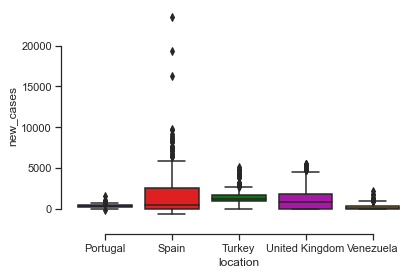

In [28]:
# Boxplot para mostrar casos diarios por pais
vtb.graf_outlD(covid_grupoD,"new_cases")


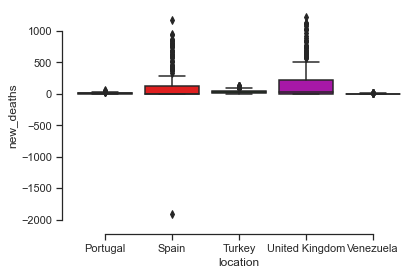

In [29]:
# Boxplot para mostrar muertes diarias por pais
vtb.graf_outlD(covid_grupoD,"new_deaths")


### TENDENCIAS

In [30]:
covid_grupoD

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
0,29643,PRT,Europe,Portugal,2020-03-01,NaN,NaN,NaN,NaN,NaN,...,9.85,16.3,30.0,3.39,82.05,NaN,NaN,NaN,NaN,NaN
1,29644,PRT,Europe,Portugal,2020-03-02,NaN,NaN,NaN,NaN,NaN,...,9.85,16.3,30.0,3.39,82.05,NaN,NaN,NaN,NaN,NaN
2,29645,PRT,Europe,Portugal,2020-03-03,2.0,2.0,NaN,0.0,0.0,...,9.85,16.3,30.0,3.39,82.05,28.0,8.0,33.0,10.0,0.00
3,29646,PRT,Europe,Portugal,2020-03-04,4.0,2.0,NaN,0.0,0.0,...,9.85,16.3,30.0,3.39,82.05,32.0,9.0,35.0,11.0,0.00
4,29647,PRT,Europe,Portugal,2020-03-05,5.0,1.0,NaN,0.0,0.0,...,9.85,16.3,30.0,3.39,82.05,31.0,10.0,37.0,13.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1010,39609,VEN,South America,Venezuela,2020-08-27,41158.0,0.0,612.857,343.0,0.0,...,6.47,NaN,NaN,0.80,72.06,57.0,75.0,107.0,133.0,0.83
1011,39610,VEN,South America,Venezuela,2020-08-28,42898.0,1740.0,761.571,358.0,15.0,...,6.47,NaN,NaN,0.80,72.06,57.0,73.0,106.0,133.0,0.83
1012,39611,VEN,South America,Venezuela,2020-08-29,43879.0,981.0,813.000,358.0,0.0,...,6.47,NaN,NaN,0.80,72.06,54.0,75.0,106.0,134.0,0.82
1013,39612,VEN,South America,Venezuela,2020-08-30,44946.0,1067.0,855.571,375.0,17.0,...,6.47,NaN,NaN,0.80,72.06,53.0,75.0,106.0,132.0,0.83


In [31]:
for elem in cols:
    vtb.grafI_grupo("date" , elem , "iso_code", covid_grupoD, False )

______________
### 4.2 ANÁLISIS INDIVIDUAL POR PAÍS GRUPO D
Show different tendencies for each column in your dataset. Show, vertically, the start date and end date of the alarm state in each plot
______________

### GRÁFICOS POR PAÍS CON REFERENCIA A LAS FECHAS DE ESTADO DE ALARMA
- CASOS TOTALES y MUERTES TOTALES
- RANKING (EVOLUCIÓN DE LA POSICIÓN DESDE EL INICIO DE LA PANDEMIA)
- CASOS DIARIOS Y MUERTES DIARIAS
- MUERTES DIARIAS y MOMENTO EN QUE LA CURVA CRECE Y DECRECE

__________________

In [32]:
col_dat1 = ["total_cases", "total_deaths", "total_cases_per_million"]
col_dat2 = [ "rank_TC", "rank_TD", "rank_TCxM", "rank_TDxM"]
for elem in paises_grupoD:
    df = covid_grupoD[covid_grupoD.iso_code==elem]
    vtb.grafI_pais(elem, col_dat1, paises_nombres[elem], df, True,alarm_dates)
    vtb.grafI_pais(elem, col_dat2, paises_nombres[elem], df, False, alarm_dates) 
    vtb.graf_daily ('New daily cases',"new_cases", 'Daily deaths', "new_deaths", elem ,df, paises_nombres[elem],alarm_dates )
    vtb.graf_dailyd ('Daily deaths', "new_deaths", elem ,df, paises_nombres[elem])



In [33]:
# Dataframe con información referencial de los países del grupo D
datos_paises = covid_grupoD.loc[:,['iso_code','population','population_density','extreme_poverty','cardiovasc_death_rate','female_smokers','male_smokers']].drop_duplicates()

In [34]:
datos_paises

,iso_code,population,population_density,extreme_poverty,cardiovasc_death_rate,female_smokers,male_smokers
0,PRT,10196707.0,112.371,0.5,127.842,16.3,30.0
184,ESP,46754783.0,93.105,1.0,99.403,27.4,31.4
429,TUR,84339067.0,104.914,0.2,171.285,14.1,41.1
600,GBR,67886004.0,272.898,0.2,122.137,20.0,24.7
845,VEN,28435943.0,36.253,NaN,204.850,NaN,NaN


### VARIACIÓN DEL STRINGENCY INDEX POR PAÍS
*Stringency Index: The Government Response Stringency Index is a composite measure based on nine response indicators including school closures, workplace closures, and travel bans, rescaled to a value from 0 to 100 (100 = strictest response).*

In [35]:
StrIdx_country = covid_grupoD.loc[:,["date","iso_code",  "stringency_index"]]

In [36]:
#Construcción del DF con Stringency Index medio mensual por país
StrIdx_country = covid_grupoD.loc[:,["date","iso_code",  "stringency_index"]]
sig = mtb.crear_sidx_df (StrIdx_country)

In [37]:
vtb.grafI_bar(sig,xval = "date",yval = "stringency_index" , col= "iso_code", mod= "group", tit= "Stringency Index per country  (Monthly mean) - Group D")

###   ANÁLISIS POR CONTINENTE

In [38]:
world_df.continent.value_counts()

Europe           10846
Asia              9881
Africa            9317
North America     6281
South America     2415
Oceania           1519
Name: continent, dtype: int64

In [39]:
vtb.grafI_area(world_df, "date", "total_deaths","continent","iso_code")

In [40]:
vtb.grafI_area(world_df, "date", "new_deaths","continent","iso_code")

In [41]:
vtb.grafI_area(world_df, "date", "total_cases","continent","iso_code")

In [42]:
vtb.grafI_area(world_df, "date", "new_cases","continent","iso_code")

### ÍNDICE DE MORTALIDAD POR PAÍS - GRUPO D
*Según la tasa de mortalidad  calculada como expresión porcentual de total de muertes / total de casos*

In [43]:
vtb.grafI_line(covid_grupoD,xval="date", yval="mortality_rate", col="location" )

### MUERTES TOTALES EN EL MUNDO (MAPA)

In [44]:
world_df_map = (world_df.groupby('location')['total_cases'].max()).to_frame()
world_df_map['index'] = world_df_map.index
world_df_map.rename(columns={'index': 'country'}, inplace=True)

In [45]:
world_df_map_td = (world_df.groupby('location')['total_deaths'].max()).to_frame()
world_df_map_td['index'] = world_df_map_td.index
world_df_map_td.rename(columns={'index': 'country'}, inplace=True)

In [46]:
vtb.grafI_mm(world_df_map,world_df_map,"total_cases", "country names", "country", "darkmint")

In [47]:
vtb.grafI_mm(world_df_map_td,world_df_map,"total_deaths", "country names", "country", "peach")

_________
### 4.3 PROGRESSION 
______________
How is the progression going each ten days (of the daily infected rate)?

In [48]:
covid_grupoD_date_indice=(covid_grupoD.set_index('date')).groupby(['date','location'])['new_cases','new_deaths'].sum()
covid_grupoD_10days = covid_grupoD_date_indice.resample('10D', level=0).sum().reset_index()

In [49]:
vtb.grafI_prog(covid_grupoD_10days, xval= "date", yval = "new_cases",tit = "Group D - 10 days Progression (Daily infected cases)",t="gD")

In [50]:
vtb.grafI_prog(covid_grupoD_10days, xval= "date", yval = "new_deaths",tit = "Group D - 10 days Progression (Daily Deaths)",t="gD")

In [51]:
world_df_date_indice=(world_df.set_index('date')).groupby(['date','location'])['new_cases','new_deaths'].sum()
world_df_10days = world_df_date_indice.resample('10D', level=0).sum().reset_index()

In [52]:
vtb.grafI_prog(world_df_10days, xval= "date", yval = "new_cases",tit = "World - 10 days Progression (Daily infected Cases)",t="W")

In [53]:
vtb.grafI_prog(world_df_10days, xval= "date", yval = "new_deaths",tit = "World - 10 days Progression (Daily deaths)",t="W")

_________
### 4.4 ANÁLISIS DE CORRELACIÓN
______________

### Correlación Países del Grupo D

In [54]:
cols_corr = ['iso_code', 'total_cases',  'total_deaths',  'total_cases_per_million',
       'total_deaths_per_million', 'total_tests', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers',  'hospital_beds_per_thousand',
       'life_expectancy', 'mortality_rate']

In [55]:
#Matriz de correlación entre variables de los países del grupo D
grupoD_corr = covid_grupoD.loc[:,cols_corr]     #Un subconjunto de las variables a contrastar

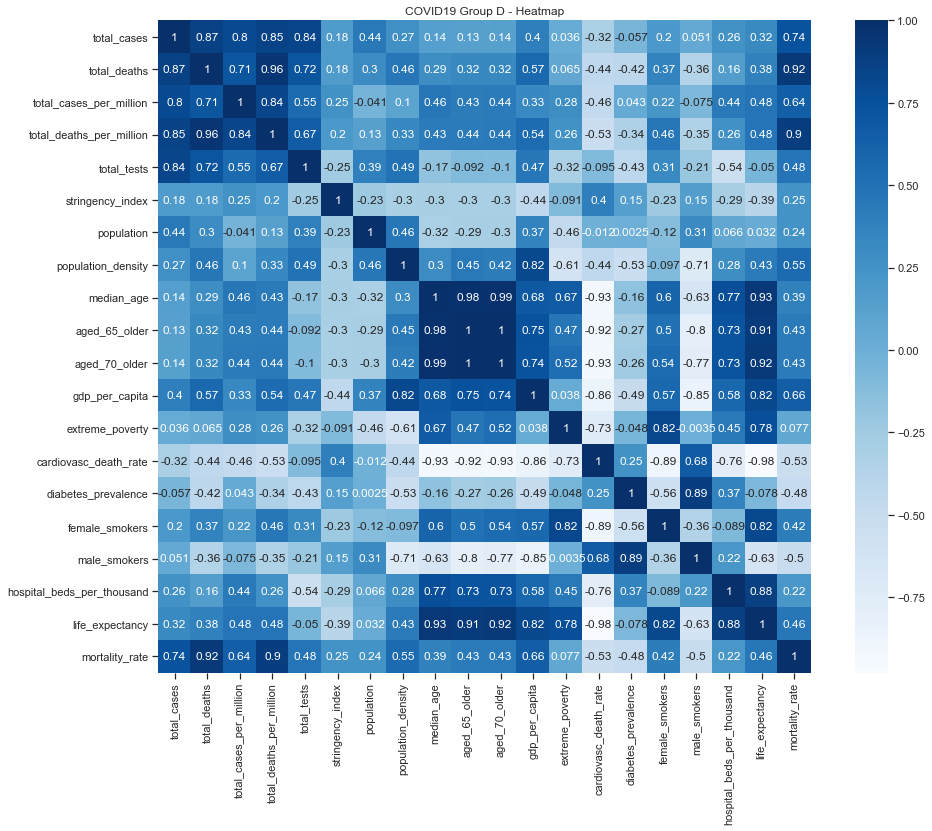

In [56]:
vtb.graf_corr (grupoD_corr, "Blues","gD")

### Correlación - Todos los paises

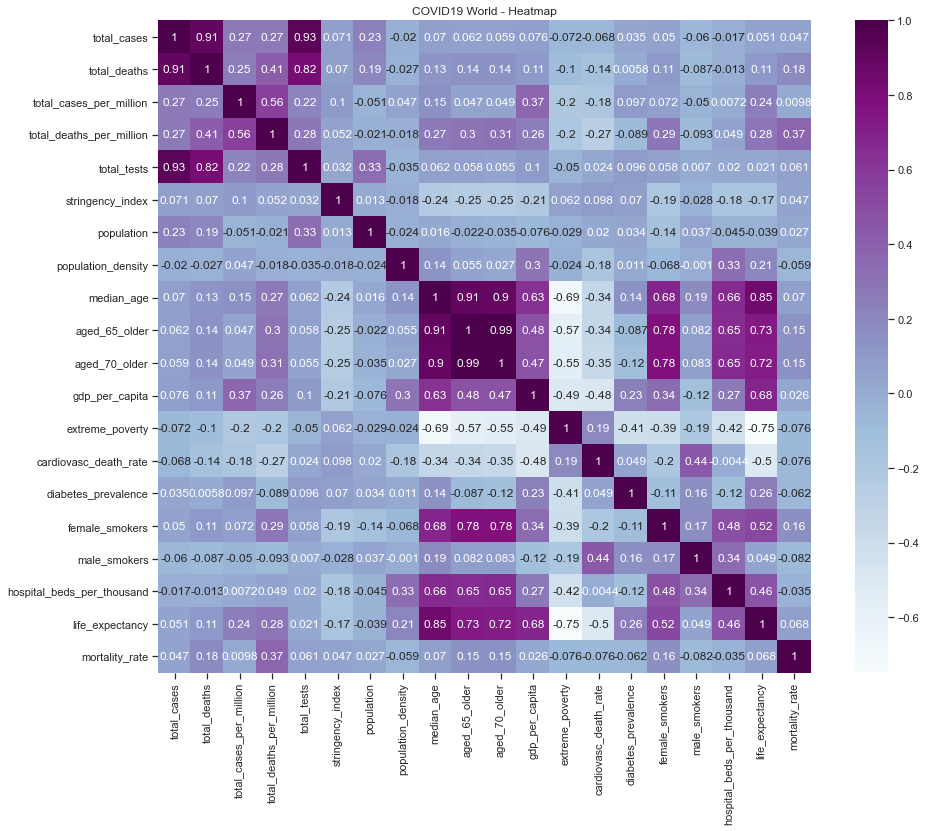

In [57]:
#Seleccion del DF mundial del subconjunto de las variables a correlacionar
world_df_corr = world_df.loc[:,cols_corr]   
vtb.graf_corr(world_df_corr, "BuPu", "W") 

### Análisis de correlación individual de cada país perteneciente al  grupo D
Se eliminan del análisis las columnas que tienen un valor estático o fijo en el tiempo en cada país, pues no aportarían información relevante.

In [58]:
cols_corr = ['iso_code', 'total_cases',  'total_deaths',  'total_cases_per_million',
       'total_deaths_per_million', 'total_tests', 'total_tests_per_thousand', 'tests_per_case', 'stringency_index','extreme_poverty', 'hospital_beds_per_thousand', 'life_expectancy', 'mortality_rate']

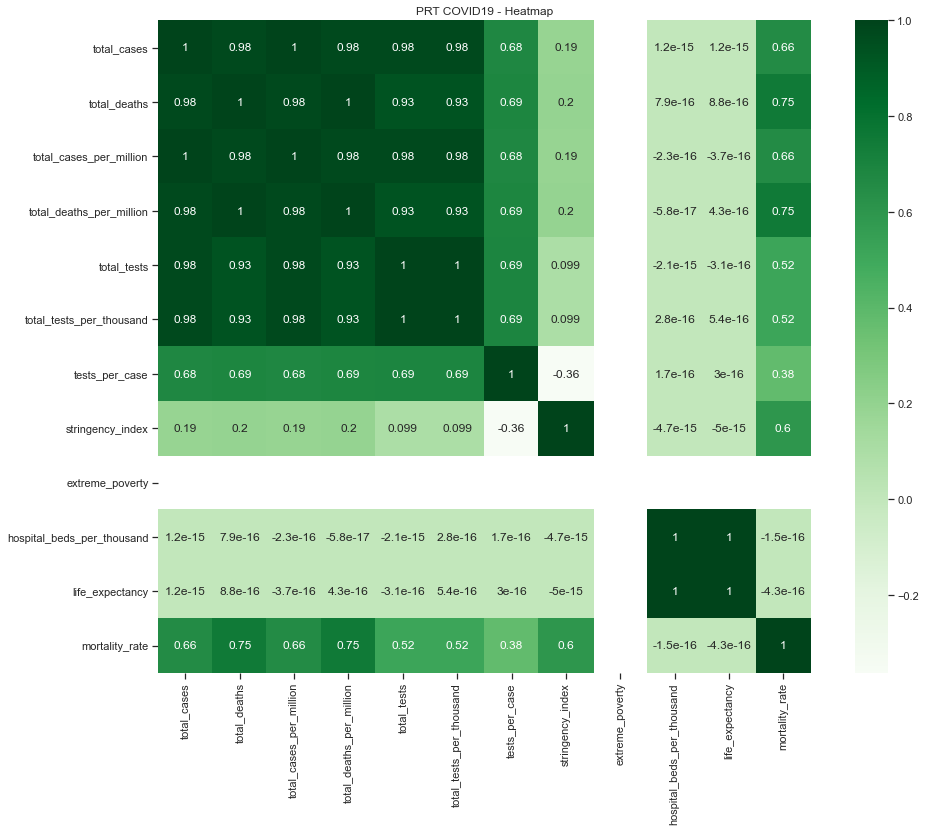

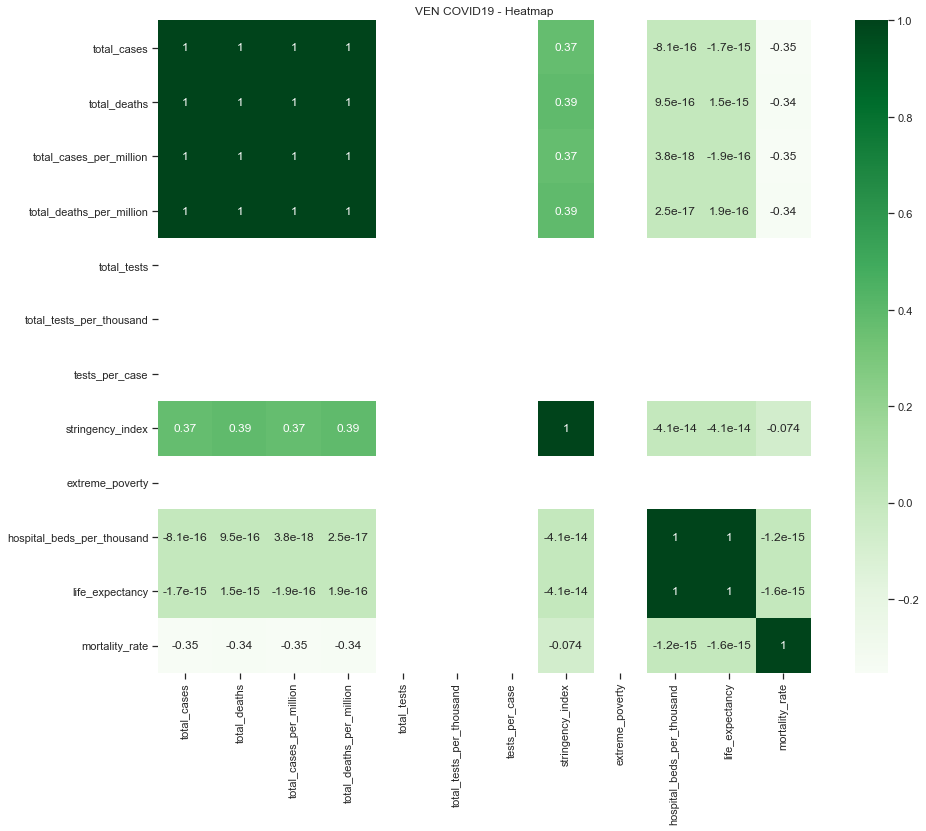

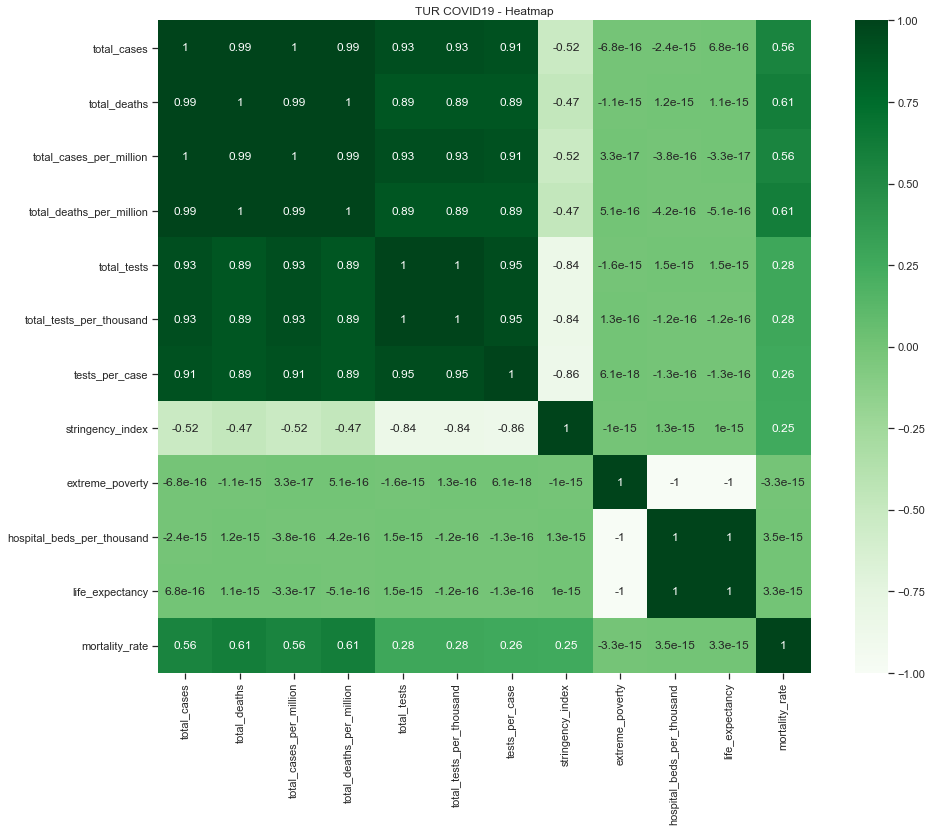

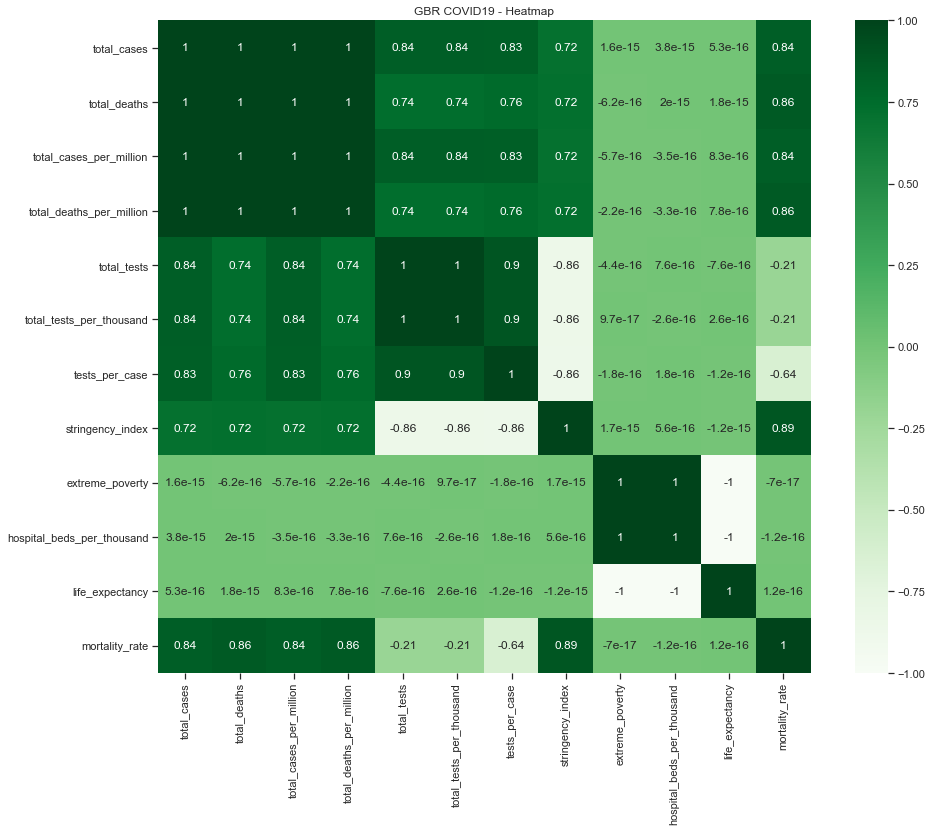

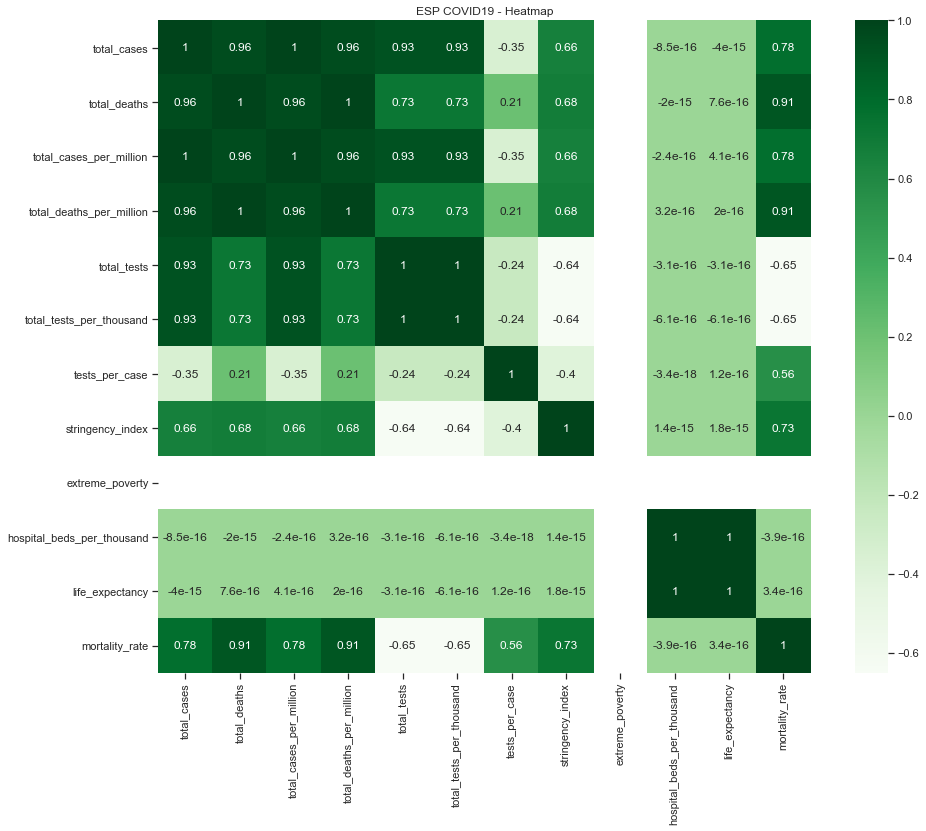

In [59]:
for elem in paises_grupoD:
    p_corr = covid_grupoD[covid_grupoD.iso_code==elem].loc[:,cols_corr]
    vtb.graf_corr(p_corr, "Greens", elem) 

## 5. Conclusiones
_________

Empezaremos con la más evidente de las conclusiones: El Covid es un fenómeno global, una pandemia que se ha extendido por la práctica totalidad de los países y territorios del Globo. Por ello, en primer lugar les mostraremos dos mapas-mundi donde se puede ver el número de casos y fallecidos en el mundo.

1) BOXPLOT - OUTLIERS

Tras esta breve introducción, creemos que lo primero que hay que ver es como son los datos que nos proporciona el dataframe. Hemos realizado los diagramas de caja y bigote (boxplot) de los casos y fallecidos diarios, que nos representará gráficamente los datos numéricos a través de sus cuartiles. De esta manera, el diagrama de caja muestra a simple vista la mediana y los cuartiles, pudiendo también representar los valores atípicos o outliers. En nuestro caso, en ambas variables vemos que hay bastantes datos atípicos(outliers) que superan el límite superior (Ls, el bigote, gráficamente hablando) e incluso alguno, como en el caso de España, son extremadamente atípicos.(posteriormente veremos a que son debidos).

2) GRÁFICAS INDIVIDUALES POR PAÍS EN RELACIÓN AL ESTADO DE ALARMA.

En las gráficas se ve como durante el estado de alarma se controló el crecimiento de casos (la pendiente de la curva) sin embargo no se observa una disminución radical de los casos luego del mismo (la curva sigue creciendo aunque de forma menos pronunciada). 
El estado de alarma sirvió para controlar la letalidad de la epidemia. En las gráficas se aprecia que posteriormente al mismo la curva de muertes totales ha permanecido estable.

3) TOTAL CASES  DIARIOS Y NEW CASES  DIARIOS, GRUPO D.

El país que aparentemente ha controlado mejor la cantidad de casos es Portugal, su curva es la que crece más lentamente. España controló muy bien los nuevos casos y logró ralentizar el crecimiento de los casos totales (entre el 15/05 y el 15/07) pero se observa claramente la segunda oleada con un incremento de casos a partir del 15 de julio.   
El estado de alarma necesitó un mes para disminuir el crecimiento de la curva de casos totales esto sucedió casi un mes después de su proclamación, A partir de este punto la pendiente de la grafica se reduce.
 Al mismo tiempo, se observa que tres semanas después de  la supresión del estado de alarma la curva de casos totales vuelve a crecer casi a la misma velocidad que en el inicio del estado de alarma.
Venezuela tiene una curva que hace pensar que está lejos de controlar la epidemia. Los nuevos casos (y por ende el total) están en pleno crecimiento.  
Gran Bretaña a pesar de tener en vigor durante más de tres meses algunas recomendaciones para   restringir  la movilidad de sus ciudadanos, no han reducido sustancialmente el incremento de  los casos totales, si bien es cierto que, en estos momentos, no han tenido nuevos repuntes de casos.  
Turquía no ha impuesto ningún estado de alarma, únicamente durante un fin de semana prohibió salir de casa. Y aunque al principio el crecimiento de los casos fué muy rápido, ahora se ha suavizado ligeramente.  
En cuanto al número de nuevos casos diarios hay que comentar que en el caso de España se puede observar en esa gráfica que en dos días(19 de Abril y 25 de Mayo) estos casos diarios fueron negativos. Esto se explica por   las correcciones que efectuó el gobierno en  los datos facilitados,  eliminando casos que anteriormente habían sido contabilizados.   

4) TOTAL DEATHS  DIARIOS Y NEW DEATHS  DIARIOS, GRUPO D.

Todos los países (especialmente Portugal y España) parecen haber controlado la letalidad de la epidemia pues sus muertes totales están más o menos estabilizadas desde el 15/06: 
En Gran Bretaña, aunque el incremento de fallecimientos se ha reducido, todavía no han logrado estabilizarlo y tienen una tasa de fallecimientos diarios muy por encima de los otros cuatros países objeto de nuestro estudio.
NOTA: Se observa claramente el descontrol y el ajuste de cifras realizado por España a mediados de mayo y en Junio. El 25 de Mayo se reduce el número de fallecidos en 1918 personas (curva de la gráfica NEW DEATHS negativa)  y a mediados de  Junio se vuelven a corregir los datos para añadir cerca de 1500 fallecidos. Esta importante variación se refleja en las distintas gráficas realizadas sobre el número de fallecidos.

5) TOTAL CASES PER MILLION AND TOTAL DEATHS PER MILLION. GRUPO D

Como los países tienen poblaciones muy dispares, la mejor forma de compararlos es por cada millón de habitantes. A pesar de que Portugal no ha sido uno de los países con más cantidad de casos (ocupa el cuarto lugar de los 5 países), su proporción en relación a su población lo ubica en el segundo lugar (por detrás de España) lo que indicaría que la incidencia también está siendo alta. En cuanto a los fallecidos por millón destacan negativamente Gran Bretaña y España sobre los otros tres países. El que Portugal a pesar de ser el segundo con más casos por millón no esté en los puestos altos de los fallecidos por millón se explica por los distintos índices de mortalidad que hay en cada país.

6)  TOTAL TEST.

Ni España ni Venezuela están reportando la cantidad de TEST realizados. UK es el país que está haciendo mayor cantidad de Test a su población (en términos absolutos) y su curva de tests crece a un ritmo mucho mayor que en el resto de países del grupo. 

7)  TOTAL TEST PER THOUSAND

En términos relativos (a la población del país) Portugal supera al resto de países del grupo por ser quien mayor cantidad de test está realizando. 
En estos momentos el número de casos se han disparado pero no así el número de fallecidos. En mi opinión esto puede ser debido a varios motivos:
•	Han aumentado el número de test que se realizan y ahora se empiezan a detectar más asintomáticos que anteriormente no aparecían en los datos- Se conoce mas sobre la enfermedad y la forma de tratarla.

•	El sistema sanitario, en este momento, no está saturado, pudiéndose ofrecer una mejor asistencia a los enfermos que impide que estos fallezcan por falta de medios, evitando el terrible triaje de enfermos.

•	Se conoce más sobre el virus y la forma de tratarlo.

8)  RANKING 

El análisis del ranking tiene sentido comparando la cantidad de casos o fallecidos por  número de habitantes (TOTAL CASES  o TOTAL DEATH per million). Siendo así, de los 5 países el único que va subiendo su posición en el ranking (es decir, que va incrementando la cantidad de casos por estar en pleno crecimiento de los contagios) es Venezuela. Por ejemplo España ocupaba la posición 4 al inicio del estado de alarma, al finalizar este se encontraba en la posición 17 y en la actualizada está por debajo de la posición 25. Para el caso del ranking de muertes totales por millón de habitantes, la situación es análoga a lo comentado anteriormente para los casos totales.
Al ser variables que están relacionadas con los demás países del mundo, las variaciones en el ranking no solo son debidas a la situación que se esté dando en ese país, sino que también dependerá de cómo se comporten los demás.

9) INDICE DE MORTALIDAD

El índice de mortalidad es la relación existente entre el número de fallecidos por Covid en relación al número de infectados, se expresa en tanto por ciento y nos da una idea de la letalidad del virus, es decir nos indica cuantos personas han fallecido por cada cien enfermos. En los meses de Marzo y hasta mediados de Marzo creció muy rápidamente, sobre todo en Gran Bretaña (en abril superó el 15%) y en España (en Mayo superó el 12%). En Portugal, Turquía y Venezuela, en ese mismo periodo de tiempo también se produce un incremento pero muchísimo menor.
Desde más o menos la primera semana de Junio, en los cinco países se aprecia como este índice va disminuyendo suavemente, coincidiendo con la disminución de nuevos casos y la mejora de las condiciones de ocupación-saturación en los hospitales.

10) COMPARACIÓN DE LOS PAISES GRUPO D  ON EL RESTO DEL MUNDO.

Se han realizado una serie de gráficos circulares donde se ha querido establecer una visión general de los casos y de los fallecimientos en el mundo. En los dos primeros se han incluido los países con las cifras más elevadas y al resto se les ha agrupado bajo la denominación de otros.
En el segundo grupo de este tipo de gráficos se ha comparado el grupo de países asignados con el resto del mundo, observando que los cinco países tienen el 5% de los casos totales, pero casi el 10% de fallecimiento.
Por último se ha comparado entre los cinco las cifras de fallecidos y casos totales, observando que en ambos Gran Bretaña y España presentan las cifras más elevadas. Pero aquí se observa una particularidad, mientras que en casos totales España supera a Gran Bretaña (36,5% - 30,5%) en cuanto a los fallecidos se produce un vuelco y Gran Bretaña supera ampliamente a España (53% - 37%). Esto entronca con lo observado anteriormente en el índice de mortalidad (GB 15, ESP 12).

11) MATRICES DE CORRELACIÓN.  
 
Muertes Totales es mayor mientras mayor es el GDP per cápita y la densidad de población
Total de muertes por millón aumenta cuando hay mayor expectativa de vida (Esto explica porque países con más viejitos tienen más mortalidad).
En la matriz de correlación de los cinco países de nuestro estudio, no se aprecian correlaciones positivas ni negativas altas entre las variables que directamente miden la incidencia del Covid (casos y fallecidos en sus distintas categorías) salvo en el número de test efectuados y en el índice de mortalidad. En este caso se aprecian correlaciones positivas altas, lo que indicaría que cuando el número de afectados y fallecidos, junto con un alto índice de mortalidad, es alto, se incrementa el número de test realizados.
Sin embargo, otros factores que a priori podrían hacer pensar que tienen influencia sobre el número de casos y el número de fallecidos por Covid, como la diabetes, la densidad de población, el envejecimiento de la población, el índice de pobreza o el stringency index, con los datos disponibles en estos momentos no se ven reflejados en estas matrices. Estos valores presentan índices de correlación muy bajos.
Si analizamos las matrices de correlación de cada uno de los cinco países del estudio, y los comparamos entre sí, se observa que en los países donde el estado de alarma no existió o fue muy corto en el tiempo, se da una mayor correlación entre este índice y el número de test realizados. Esto podría hacernos pensar que en esos países optaron por medidas menos restrictivas, compensándolo con un mayor número de test realizados para detectar nuevos casos. 
En la matriz de correlación de Gran Bretaña se da un hecho curioso y diametralmente opuesto a lo que sucede en los otros cuatro países. La correlación entre la esperanza de vida y el número de camas de hospital es -1, es decir a menor número de camas en hospitales mayor es la esperanza de vida (esto no habla bien del NHS). En los otros cuatro países la correlación es máxima y positiva.
